In [1]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPool2D, AvgPool2D, Activation, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB4
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.metrics import Recall, Precision
import tensorflow.keras.backend as K
import datetime
import numpy as np
import pandas as pd
import PIL
from PIL import ImageOps
import os
from pathlib import Path
from IPython.display import Image, display

In [2]:
tf.__version__

'2.3.0'

In [3]:
df = pd.read_csv('~/Desktop/freelancer_drone/data/class_dict_seg.csv')
num_classes = df.shape[0] - 1 

In [75]:
IMG_SIZE = 640

In [5]:
input_dir = 'data/dataset/semantic_drone_dataset/original_images'
target_dir = 'data/dataset/semantic_drone_dataset/label_images_semantic'
color_dir = 'data/RGB_color_image_masks/RGB_color_image_masks'

In [6]:
input_img_paths = sorted([i for i in Path(input_dir).glob('**/*.jpg')])
input_lbl_paths = sorted([i for i in Path(target_dir).glob('**/*.png')])
color_paths = sorted([i for i in Path(color_dir).glob('**/*.png')])

In [7]:
i_ = np.zeros((10,) + (256, 256) + (1, ), dtype='uint8')
img = load_img('data/dataset/semantic_drone_dataset/label_images_semantic/491.png', target_size=(256,256), color_mode='grayscale')

In [8]:
np.unique(np.expand_dims(img, 2))

array([ 1,  6,  8, 15, 22], dtype=uint8)

In [9]:
i_[0] = np.expand_dims(img, 2)

In [10]:
np.unique(i_[0])

array([ 1,  6,  8, 15, 22], dtype=uint8)

In [76]:
class CDG(tf.keras.utils.Sequence):
    def __init__(self, batch_size, img_size, input_image_path, target_image_path, num_classes):
        self.batch_size = batch_size
        self.img_size = img_size
        self.input_image_path = input_image_path
        self.target_image_path = target_image_path
        self.num_classes = num_classes
    
    def __len__(self):
        return len(self.target_image_path) // self.batch_size
    
    def __random_flip(self, x, y):
        rand = np.random.randint(0, 21)
        if rand % 3 == 0:
            x = tf.image.flip_left_right(x)
            y = tf.image.flip_left_right(y)

        return x, y
                    
    def __random_cont(self, x):
            x = tf.image.random_contrast(x, .1, .2)
            #display(tf.keras.preprocessing.image.array_to_img(x[0]))
            return x
        
    def __getitem__(self, idx):
        input_batch = self.input_image_path[idx*self.batch_size : idx*self.batch_size + self.batch_size]
        target_batch = self.target_image_path[idx*self.batch_size : idx*self.batch_size + self.batch_size]
        
        x = np.zeros((self.batch_size,) + self.img_size + (3, ), dtype='float32')
        for j, path in enumerate(input_batch):
            img = load_img(path, target_size=self.img_size)
            #img = np.asarray(img) / 255
            img = np.asarray(img)
            x[j] = img
            
        
        y = np.zeros((self.batch_size,) + self.img_size + (1, ), dtype='uint8')
        for j, path in enumerate(target_batch):
            img = load_img(path, target_size=self.img_size, color_mode='grayscale')
            #img = np.asarray(img) / self.num_classes
            y[j] = np.expand_dims(img, 2)
            
        #x = self.__random_cont(x)
        #x, y  = self.__random_flip(x, y)
        
        #display(tf.keras.preprocessing.image.array_to_img(x[0]))
        #display(tf.keras.preprocessing.image.array_to_img(y[0]))
        
        return x, y

In [12]:
def dice_coef(y_true, y_pred, smooth=1e-7):
    '''
    Dice coefficient for 24 categories. Ignores background pixel label 0
    Pass to model as metric during compile statement
    '''
    y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=23)[...,1:])
    y_pred_f = K.flatten(y_pred[...,1:])
    intersect = K.sum(y_true_f * y_pred_f, axis=-1)
    denom = K.sum(y_true_f + y_pred_f, axis=-1)
    return K.mean((2. * intersect / (denom + smooth)))

def dice_loss(y_true, y_pred):
    '''
    Dice loss to minimize. Pass to model as loss during compile statement
    '''
    return 1 - dice_coef(y_true, y_pred)


In [13]:
def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(num_filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x

In [14]:
def decoder(inputs, skip, num_filters):
    x = Conv2DTranspose(num_filters,(2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip])
    x = conv_block(x, num_filters)
    
    return x

In [15]:
def eff_unet(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    enc = EfficientNetB0(include_top=False, weights="imagenet", input_tensor=inputs)
    s1 = enc.get_layer("input_1").output     
    s2 = enc.get_layer("block2a_expand_activation").output    
    s3 = enc.get_layer("block3a_expand_activation").output    
    s4 = enc.get_layer("block4a_expand_activation").output 
    
    bn = enc.get_layer("block6a_expand_activation").output

    
    db1 = decoder(bn, s4, 512)
    db2 = decoder(db1, s3, 256)
    db3 = decoder(db2, s2, 128)
    db4 = decoder(db3, s1, 64)
    
    
    outputs = Conv2D(num_classes, 3, padding='same', activation='softmax')(db4)
    
    model = Model(inputs, outputs)
    return model


In [16]:
x_train, y_train, c_train = input_img_paths[:int(.9*len(input_img_paths))], input_lbl_paths[:int(.9*len(input_img_paths))], color_paths[:int(.9*len(input_img_paths))]
x_val, y_val, c_val = input_img_paths[int(.9*len(input_img_paths)):], input_lbl_paths[int(.9*len(input_img_paths)):], color_paths[int(.9*len(input_img_paths)):] 

In [17]:
x_train[:3]

[PosixPath('data/dataset/semantic_drone_dataset/original_images/000.jpg'),
 PosixPath('data/dataset/semantic_drone_dataset/original_images/001.jpg'),
 PosixPath('data/dataset/semantic_drone_dataset/original_images/002.jpg')]

In [18]:
y_train[:3]

[PosixPath('data/dataset/semantic_drone_dataset/label_images_semantic/000.png'),
 PosixPath('data/dataset/semantic_drone_dataset/label_images_semantic/001.png'),
 PosixPath('data/dataset/semantic_drone_dataset/label_images_semantic/002.png')]

In [19]:
train_gen = CDG(5, (IMG_SIZE, IMG_SIZE), x_train, y_train, num_classes)
val_gen = CDG(5, (IMG_SIZE, IMG_SIZE), x_val, y_val, num_classes)

In [20]:
np.unique(train_gen[0][1])

array([ 0,  1,  2,  3,  4,  6,  8,  9, 10, 11, 12, 13, 14, 15, 17, 18, 19,
       20, 21, 22], dtype=uint8)

In [72]:
model_name = 'models/drone_segmentation_600_wscalingboth_10ep_sparse.h5'

In [22]:
input_shape = (IMG_SIZE, IMG_SIZE, 3)
model = eff_unet(input_shape, num_classes)
opt = tf.keras.optimizers.Adam(1e-2)
save_best = tf.keras.callbacks.ModelCheckpoint(model_name, monitor="val_loss", verbose=0, save_best_only=True)
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [23]:
hist = model.fit(train_gen, epochs=10, validation_data=val_gen, callbacks=[tensorboard_callback, save_best])

Epoch 1/10
 1/72 [..............................] - ETA: 0s - loss: 3.7253 - sparse_categorical_accuracy: 0.0125WARNING:tensorflow:From /home/scutum/envs/data-science/lib/python3.8/site-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
72/72 [==============================] - 144s 2s/step - loss: 1.4822 - sparse_categorical_accuracy: 0.5717 - val_loss: 4.0213 - val_sparse_categorical_accuracy: 0.2995
Epoch 2/10
72/72 [==============================] - 142s 2s/step - loss: 1.1486 - sparse_categorical_accuracy: 0.6600 - val_loss: 1.4458 - val_sparse_categorical_accuracy: 0.6157
Epoch 3/10
72/72 [==============================] - 141s 2s/step - loss: 1.0353 - sparse_categorical_accuracy: 0.6888 - val_loss: 2.0840 - val_sparse_categorical_accuracy: 0.3913
Epoch 4/10
72/72 [==============================] - 142s 2s/step

In [73]:
model = load_model(model_name)

In [74]:
preds = model.predict(val_gen)

InvalidArgumentError:  Conv2DSlowBackpropInput: Size of out_backprop doesn't match computed: actual = 16, computed = 40 spatial_dim: 2 input: 80 filter: 2 output: 16 stride: 2 dilation: 1
	 [[node functional_1/conv2d_transpose/conv2d_transpose (defined at <ipython-input-74-9e97076a0112>:1) ]] [Op:__inference_predict_function_69371]

Function call stack:
predict_function


In [ ]:
preds.shape

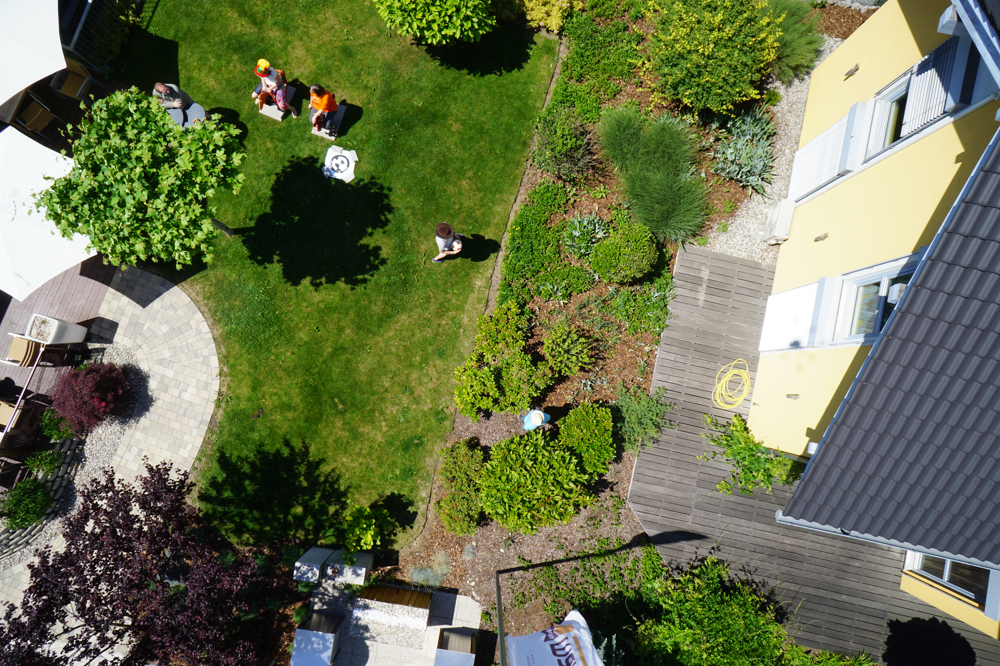

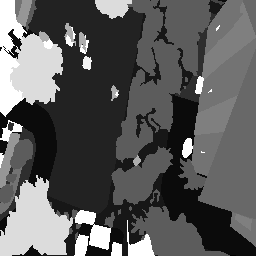

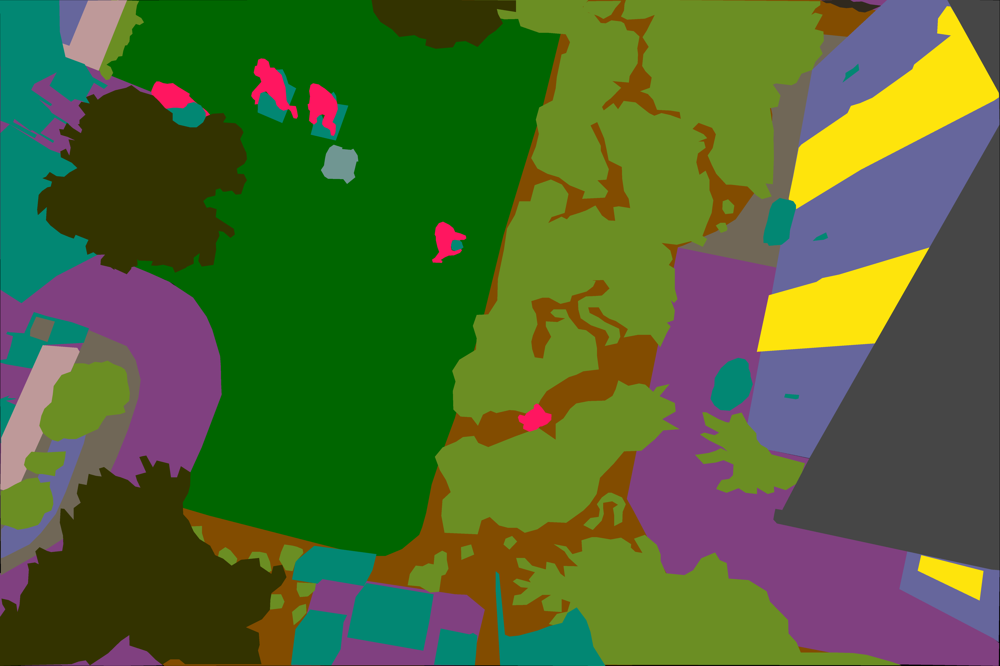

[ 1  2  3  4  5  6  8  9 10 13 15 16 17 18 19 20 21 22]


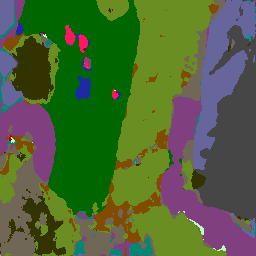

In [62]:
def display_mask(i):
    """Quick utility to display a model's prediction."""
    mask = np.argmax(preds[i], axis=-1)
    print(np.unique(mask))
    #mask = np.expand_dims(mask, axis=-1)
    #print(mask.shape)
    
    seg_img = np.zeros((IMG_SIZE, IMG_SIZE, 3))
    seg_img_gs = np.zeros((IMG_SIZE, IMG_SIZE, 3))
    
    for c in range(num_classes): 
        c_codes = [df[' r'][c],  df[' g'][c], df[' b'][c]]
        for i in range(3):
            seg_arr_c = mask[:, :] == c
            seg_img[:, :, i] += ((seg_arr_c)*(c_codes[i])).astype('uint8')
            
    for c in range(num_classes): 
        for i in range(3):
            seg_arr_c_gs = mask[:, :] == c
            seg_img_gs[:, :, i] += ((seg_arr_c_gs)*(c)).astype('uint8')
    
            
    #img = PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(mask))
    img = tf.keras.preprocessing.image.array_to_img(seg_img)
    display(img)
    return seg_img_gs

# Display results for validation image #10
i = 0

# Display input image
display(Image(filename=x_val[i], width=IMG_SIZE, height=IMG_SIZE))

# Display ground-truth target mask
img = PIL.ImageOps.autocontrast(load_img(y_val[i], target_size=(IMG_SIZE, IMG_SIZE)))
display(img)

# Display color mask
display(Image(filename=c_val[i], width=IMG_SIZE, height=IMG_SIZE))

# Display mask predicted by our model
seg_img_gs = display_mask(i)  # Note that the model only sees inputs at 150x150.

In [70]:
preds[0].shape

(256, 256, 23)

In [71]:
np.argmax(preds[0], axis=-1).shape

(256, 256)

In [63]:
m = tf.keras.metrics.MeanIoU(num_classes=23)

In [64]:
np.asarray(load_img(y_val[0], target_size=(IMG_SIZE, IMG_SIZE)))

array([[[22, 22, 22],
        [22, 22, 22],
        [22, 22, 22],
        ...,
        [ 9,  9,  9],
        [ 9,  9,  9],
        [ 9,  9,  9]],

       [[22, 22, 22],
        [22, 22, 22],
        [22, 22, 22],
        ...,
        [ 9,  9,  9],
        [ 9,  9,  9],
        [ 9,  9,  9]],

       [[22, 22, 22],
        [22, 22, 22],
        [22, 22, 22],
        ...,
        [ 9,  9,  9],
        [ 9,  9,  9],
        [ 9,  9,  9]],

       ...,

       [[19, 19, 19],
        [19, 19, 19],
        [19, 19, 19],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[19, 19, 19],
        [19, 19, 19],
        [19, 19, 19],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[19, 19, 19],
        [19, 19, 19],
        [19, 19, 19],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]]], dtype=uint8)

In [65]:
seg_img_gs

array([[[10., 10., 10.],
        [10., 10., 10.],
        [10., 10., 10.],
        ...,
        [ 9.,  9.,  9.],
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.]],

       [[10., 10., 10.],
        [10., 10., 10.],
        [10., 10., 10.],
        ...,
        [10., 10., 10.],
        [10., 10., 10.],
        [ 1.,  1.,  1.]],

       [[10., 10., 10.],
        [10., 10., 10.],
        [10., 10., 10.],
        ...,
        [10., 10., 10.],
        [10., 10., 10.],
        [ 9.,  9.,  9.]],

       ...,

       [[19., 19., 19.],
        [ 4.,  4.,  4.],
        [ 4.,  4.,  4.],
        ...,
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.]],

       [[ 8.,  8.,  8.],
        [ 4.,  4.,  4.],
        [ 4.,  4.,  4.],
        ...,
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.]],

       [[13., 13., 13.],
        [ 4.,  4.,  4.],
        [ 4.,  4.,  4.],
        ...,
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.]]

In [66]:
m.update_state(np.asarray(load_img(y_val[0], target_size=(IMG_SIZE, IMG_SIZE))), seg_img_gs)

<tf.Variable 'UnreadVariable' shape=(23, 23) dtype=float64, numpy=
array([[0.0000e+00, 1.8000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00],
       [0.0000e+00, 1.9089e+04, 2.5500e+02, 3.7200e+02, 3.2910e+03,
        3.0000e+00, 0.0000e+00, 0.0000e+00, 7.3500e+02, 2.4900e+02,
        1.8000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        6.0000e+00, 0.0000e+00, 1.8000e+01, 6.0000e+00, 1.8300e+02,
        2.6100e+02, 0.0000e+00, 5.7000e+01],
       [0.0000e+00, 2.6100e+02, 5.0910e+03, 2.5800e+02, 9.1800e+02,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 5.5320e+03, 0.0000e+00,
        3.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.8000e+01,
        0.0000e+00, 0.0000e

In [67]:
m.result().numpy()

0.24267817